In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm() 

Gen RAM Free: 19.3 GB  | Proc size: 14.7 GB
GPU RAM Free: 16270MB | Used: 10MB | Util   0% | Total 16280MB


In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
from sklearn import linear_model
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import torch
import torch.nn as nn
import folium
from folium import FeatureGroup, LayerControl, Map, Marker
from folium.plugins import HeatMap
from folium.plugins import TimestampedGeoJson
from folium.plugins import MarkerCluster

In [0]:
df = pd.read_csv('new_york_taxi_fare.csv')

In [0]:
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [0]:
df.isnull().sum()

key                   0
fare_amount           0
pickup_datetime       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude    10
dropoff_latitude     10
passenger_count       0
dtype: int64

In [0]:
df.dropna(how = 'any', inplace = True)

In [0]:
df.shape

(1199990, 8)

In [0]:
duplicate_df = df[df.duplicated()]
print('Duplicate Rows: ', duplicate_df.shape)

Duplicate Rows:  (0, 8)


#### FARE AMOUNT ANALYSIS

In [0]:
df['fare_amount'].describe()

count    1.199990e+06
mean     1.134186e+01
std      9.877427e+00
min     -4.500000e+01
25%      6.000000e+00
50%      8.500000e+00
75%      1.250000e+01
max      1.273310e+03
Name: fare_amount, dtype: float64

Fare amount cannot be a negative value. From the above information, we can observe that the minimum value is -$4.5. <br>
So i will be creating an array with the index value of all the negative fare amounts.<br>


In [0]:
neg_fare = np.array(np.where(df['fare_amount']<0))

In [0]:
neg_fare

array([[   2039,    2486,   13032,   28839,   36722,   42337,   56748,
          58937,   97838,  102938,  165146,  179310,  182340,  288958,
         298410,  301354,  323635,  399782,  427599,  443465,  481414,
         512489,  519527,  534745,  549204,  577718,  605419,  698279,
         738396,  740834,  743718,  748544,  857254,  857712,  878014,
         888587,  896057,  963979, 1032438, 1042327, 1054596, 1071082,
        1083712, 1108352, 1118453, 1132391, 1164715, 1195260, 1196258,
        1197284]])

In [0]:
df.drop(df.index[neg_fare], inplace = True)

In [0]:
df['fare_amount'].describe()

count    1.199940e+06
mean     1.134260e+01
std      9.876793e+00
min      0.000000e+00
25%      6.000000e+00
50%      8.500000e+00
75%      1.250000e+01
max      1.273310e+03
Name: fare_amount, dtype: float64

#### PASSENGER COUNT ANALYSIS

In [0]:
df['passenger_count'].describe()

count    1.199940e+06
mean     1.684294e+00
std      1.320778e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.000000e+00
75%      2.000000e+00
max      2.080000e+02
Name: passenger_count, dtype: float64

Generally a new york taxi can accomodate 4 people. But the above describe method shows that there a 208 people in a taxi.<br>
If we there are more than 4 people in a taxi, that record will be dropped.

In [0]:
taxi_carry = np.array(np.where(df['passenger_count']>4))

In [0]:
taxi_carry

array([[     38,      48,      60, ..., 1199909, 1199930, 1199933]])

In [0]:
df.drop(df.index[taxi_carry], inplace = True)

In [0]:
df.shape

(1089785, 8)

#### LATITUDE AND LONGITUDE ANALYSIS

Latitude and Longitude values have to fall in a range of x and y values.<br>

Latitude(y-values) : -90 to +90<br>
Longitude(x-values) : -180 to +180

In [0]:
df['pickup_latitude'].describe()

count    1.089785e+06
mean     3.993679e+01
std      7.639745e+00
min     -3.116285e+03
25%      4.073493e+01
50%      4.075262e+01
75%      4.076706e+01
max      2.621628e+03
Name: pickup_latitude, dtype: float64

In [0]:
df['dropoff_latitude'].describe()

count    1.089785e+06
mean     3.993048e+01
std      8.269349e+00
min     -3.114339e+03
25%      4.073403e+01
50%      4.075315e+01
75%      4.076808e+01
max      1.989728e+03
Name: dropoff_latitude, dtype: float64

In [0]:
out_lat_pickup = np.array(np.where((df['pickup_latitude']< -90) | (df['pickup_latitude'] > 90)))

In [0]:
out_lat_drop = np.array(np.where((df['dropoff_latitude']< -90) | (df['dropoff_latitude'] > 90)))

Here, we can observe that there are values beyond the range and we have to filter such values from the dataframe.

In [0]:
lat_out = np.column_stack((out_lat_pickup,out_lat_drop))

In [0]:
df.drop(df.index[lat_out], inplace = True)

In [0]:
df['pickup_longitude'].describe()

count    1.089763e+06
mean    -7.253266e+01
std      1.063229e+01
min     -1.452988e+03
25%     -7.399208e+01
50%     -7.398182e+01
75%     -7.396717e+01
max      4.085036e+01
Name: pickup_longitude, dtype: float64

In [0]:
df['dropoff_longitude'].describe()

count    1.089763e+06
mean    -7.253086e+01
std      1.052319e+01
min     -1.329621e+03
25%     -7.399140e+01
50%     -7.398016e+01
75%     -7.396375e+01
max      4.558162e+01
Name: dropoff_longitude, dtype: float64

In [0]:
out_long_pickup = np.array(np.where((df['pickup_longitude']< -180) | (df['pickup_longitude'] > 180)))

In [0]:
out_long_drop = np.array(np.where((df['dropoff_longitude']< -180) | (df['dropoff_longitude'] > 180)))

In [0]:
out_long = np.column_stack((out_long_pickup,out_long_drop))

After finding all such outlier values, we can drop them from the dataset.

In [0]:
df.drop(df.index[out_long], inplace = True)

#### NEW YORK LATITUDE AND LONGITUDE

Considering the city of New York, we have to keep in mind the longitude and latitude boundaries of the city. After some domain research, i found out that,<br>

<b>Longitude Boundary - (-74.03, -73.75)<br>

<b>Latitude Boundary - (40.63, 40.85)<br>
    
Hence, we need to remove values outside this boundary.

In [0]:
boundary = {'min_lng':-74.263242,
              'min_lat':40.573143,
              'max_lng':-72.986532, 
              'max_lat':41.709555}

In [0]:
outside_nyc = np.array(np.where(~((df.pickup_longitude >= boundary['min_lng'] ) & (df.pickup_longitude <= boundary['max_lng']) &
            (df.pickup_latitude >= boundary['min_lat']) & (df.pickup_latitude <= boundary['max_lat']) &
            (df.dropoff_longitude >= boundary['min_lng']) & (df.dropoff_longitude <= boundary['max_lng']) &
            (df.dropoff_latitude >=boundary['min_lat']) & (df.dropoff_latitude <= boundary['max_lat']))))

In [0]:
df.drop(df.index[outside_nyc], inplace = True)

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1066838 entries, 0 to 1199999
Data columns (total 8 columns):
key                  1066838 non-null object
fare_amount          1066838 non-null float64
pickup_datetime      1066838 non-null object
pickup_longitude     1066838 non-null float64
pickup_latitude      1066838 non-null float64
dropoff_longitude    1066838 non-null float64
dropoff_latitude     1066838 non-null float64
passenger_count      1066838 non-null int64
dtypes: float64(5), int64(1), object(2)
memory usage: 73.3+ MB


### EXPLORATORY DATA ANALYSIS

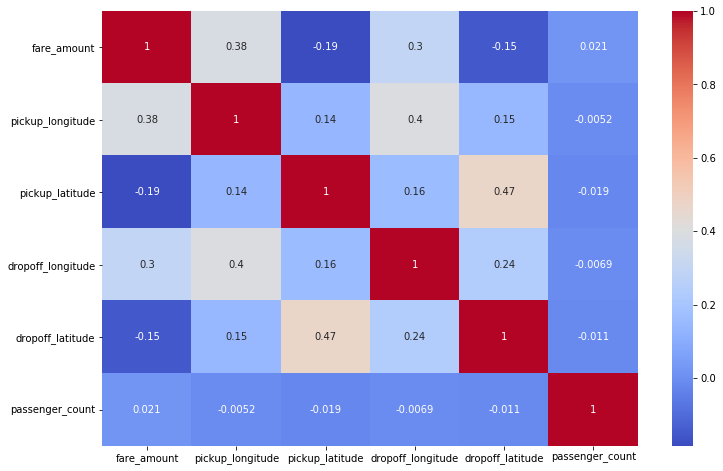

In [0]:
feat_corr = df.corr()
plt.figure(figsize = (12,8))
sns.heatmap(feat_corr, annot = True, cmap = 'coolwarm')
b, t = plt.ylim() 
b += 0.5 
t -= 0.5 
plt.ylim(b, t)
plt.show()

In [0]:
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])

In [0]:
df['hour'] = df['pickup_datetime'].dt.hour
df['day_of_week'] = df['pickup_datetime'].dt.day
df['month'] = df['pickup_datetime'].dt.month
df['year'] = df['pickup_datetime'].dt.year

We can gain more insight on the fare amount by calculating the distance between the pickup and dropoff locations based on the latitude and longitude values.<br>

For this we have to use the <b>Haversine Distance Formula.

In [0]:
def haversine_distance(df, lat1, long1, lat2, long2):
    """
    Calculates the haversine distance between 2 sets of GPS coordinates in df
    """
    r = 6371  # average radius of Earth in kilometers
       
    phi1 = np.radians(df[lat1])
    phi2 = np.radians(df[lat2])
    
    delta_phi = np.radians(df[lat2]-df[lat1])
    delta_lambda = np.radians(df[long2]-df[long1])
     
    a = np.sin(delta_phi/2)**2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    d = (r * c) # in kilometers

    return d

In [0]:
df['distance'] = haversine_distance(df,'pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude')

In [0]:
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,hour,day_of_week,month,year
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,0.410442,17,15,6,2009
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,4.628504,16,5,1,2010
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,1.001022,0,18,8,2011
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,0.910440,4,21,4,2012
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,1.361021,7,9,3,2010


For Exploratory Data Analysis, there are some hypothesis that i would like to test.<br>

<b>1. Highest Pickup and Dropoff Locations within NYC

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:420: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  numeric_data[col] = np.asarray(numeric_data[col])


(40.63, 40.85)

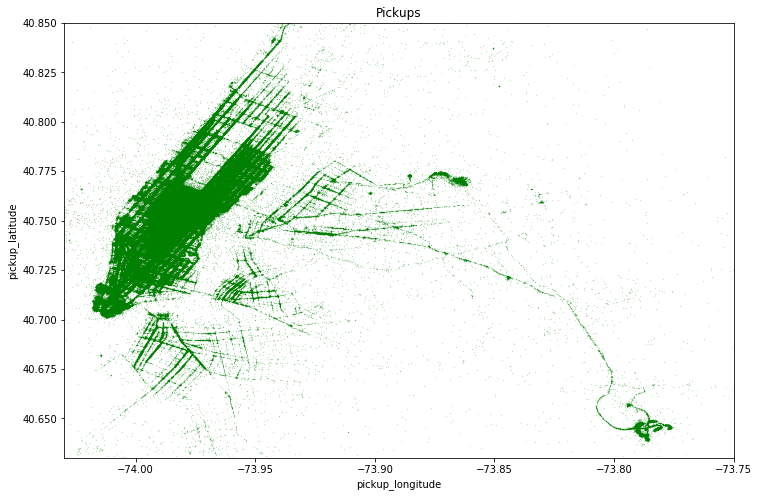

In [0]:
long_border = (-74.03, -73.75)
lat_border = (40.63, 40.85)

df.plot(x = 'pickup_longitude', y = 'pickup_latitude', kind = 'scatter',s=.02, alpha=.6,title = 'Pickups',figsize = (12,8),color = 'green')
plt.xlim(long_border)
plt.ylim(lat_border)

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/core.py:420: FutureWarning: Converting timezone-aware DatetimeArray to timezone-naive ndarray with 'datetime64[ns]' dtype. In the future, this will return an ndarray with 'object' dtype where each element is a 'pandas.Timestamp' with the correct 'tz'.
	To accept the future behavior, pass 'dtype=object'.
	To keep the old behavior, pass 'dtype="datetime64[ns]"'.
  numeric_data[col] = np.asarray(numeric_data[col])


(40.63, 40.85)

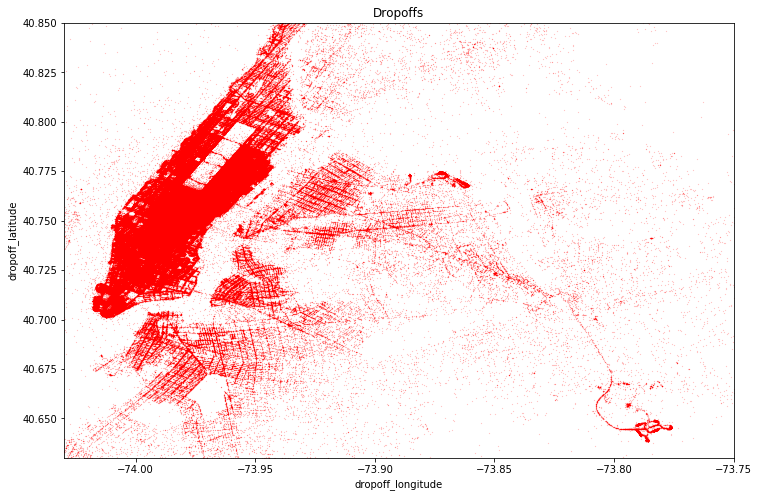

In [0]:
long_border = (-74.03, -73.75)
lat_border = (40.63, 40.85)

df.plot(x = 'dropoff_longitude', y = 'dropoff_latitude', kind = 'scatter',s=.02, alpha=.6,title = 'Dropoffs',figsize = (12,8),color = 'red')
plt.xlim(long_border)
plt.ylim(lat_border)

Airport trips are quite expensive as they are far from the main city.<br>

I will be trying to check the fare amount from the two main airports in New York<br>

1. John F Kennedy International Airport
2. La Guardia Airport

In [0]:
JFK = {'min_long':-73.8352,
     'min_lat':40.6195,
     'max_long':-73.7401, 
     'max_lat':40.6659}

In [0]:
jfk_center = [40.6437,-73.7900]

jfk_pickup = df.loc[(df['pickup_longitude']>= JFK['min_long']) & (df['pickup_longitude'] <= JFK['max_long'])]

jfk_pickup = df.loc[(df['pickup_latitude']>= JFK['min_lat']) & (df['pickup_latitude'] <= JFK['max_lat'])]

jfk_pickup.shape[0]

17308

In [0]:
jfk_dropoff = df.loc[(df['dropoff_longitude']>= JFK['min_long']) & (df['dropoff_longitude'] <= JFK['max_long'])]

jfk_dropoff = df.loc[(df['dropoff_latitude']>= JFK['min_lat']) & (df['dropoff_latitude'] <= JFK['max_lat'])]

jfk_dropoff.shape[0]

15511

In [0]:
m=folium.Map(location =jfk_center,zoom_start = 10,)
folium.Marker(location=jfk_center, popup='JFK Airport',icon=folium.Icon(color='black')).add_to(m)

mc = MarkerCluster().add_to(m)
#Add markers in blue for each pickup location and line between JFK and Pickup location over time. The thickness of line indicates the fare_amount

for index,row in jfk_pickup.iterrows():
    folium.CircleMarker([row['dropoff_latitude'],row['dropoff_longitude']],radius = 3).add_to(m)

In [0]:
m

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


Text(0.5, 1.0, 'Fare Amount Distribution')

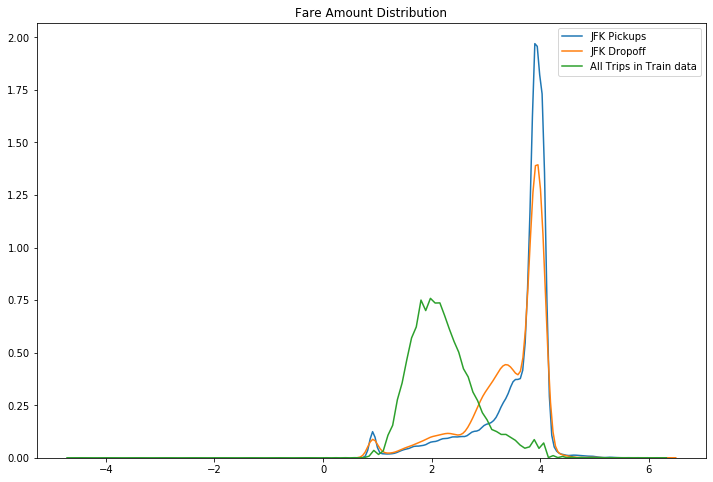

In [0]:
plt.figure(figsize = (12,8))
sns.kdeplot(np.log(jfk_pickup['fare_amount'].values),label='JFK Pickups')
sns.kdeplot(np.log(jfk_dropoff['fare_amount'].values),label='JFK Dropoff')
sns.kdeplot(np.log(df['fare_amount'].values),label='All Trips in Train data')
plt.title("Fare Amount Distribution")

Pickup fare amount is pretty high compared to dropoff fare amount.<br>

We also observe that fare amount to and from the airport are high compared to overall trip fare amounts.

The city of new york is mainly divided into 5 boroughs. Namely-<br>

1. Manhatten
2. Queens
3. Brooklyn
4. Bronx
5. Staten Island

In [0]:
nyc_boroughs = {
        'manhattan':{
        'min_lng':-74.0479,
        'min_lat':40.6829,
        'max_lng':-73.9067,
        'max_lat':40.8820
    },
    
    'queens':{
        'min_lng':-73.9630,
        'min_lat':40.5431,
        'max_lng':-73.7004,
        'max_lat':40.8007

    },

    'brooklyn':{
        'min_lng':-74.0421,
        'min_lat':40.5707,
        'max_lng':-73.8334,
        'max_lat':40.7395

    },

    'bronx':{
        'min_lng':-73.9339,
        'min_lat':40.7855,
        'max_lng':-73.7654,
        'max_lat':40.9176

    },

    'staten_island':{
        'min_lng':-74.2558,
        'min_lat':40.4960,
        'max_lng':-74.0522,
        'max_lat':40.6490

    }
    
}

In [0]:
def borough(lat,long):
    locs=nyc_boroughs.keys()
    for loc in locs:
        if lat>=nyc_boroughs[loc]['min_lat'] and lat<=nyc_boroughs[loc]['max_lat'] and long>=nyc_boroughs[loc]['min_lng'] and long<=nyc_boroughs[loc]['max_lng']:
            return loc
    return 'others'

In [0]:
df['pickup_borough'] = df.apply(lambda row : borough(row['pickup_latitude'],row['pickup_longitude']), axis = 1)
df['dropoff_borough'] = df.apply(lambda row : borough(row['dropoff_latitude'],row['dropoff_longitude']), axis = 1)

In [0]:
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,hour,day_of_week,month,year,pickup_borough,dropoff_borough
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21+00:00,-73.844311,40.721319,-73.841610,40.712278,1,0.410442,17,15,6,2009,queens,queens
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16+00:00,-74.016048,40.711303,-73.979268,40.782004,1,4.628504,16,5,1,2010,manhattan,manhattan
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00+00:00,-73.982738,40.761270,-73.991242,40.750562,2,1.001022,0,18,8,2011,manhattan,manhattan
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42+00:00,-73.987130,40.733143,-73.991567,40.758092,1,0.910440,4,21,4,2012,manhattan,manhattan
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00+00:00,-73.968095,40.768008,-73.956655,40.783762,1,1.361021,7,9,3,2010,manhattan,manhattan


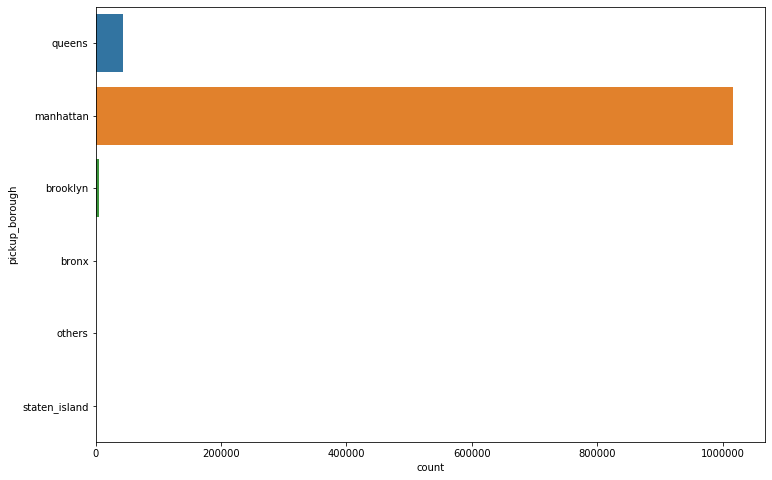

In [0]:
plt.figure(figsize = (12,8))
sns.countplot(y = df['pickup_borough'])

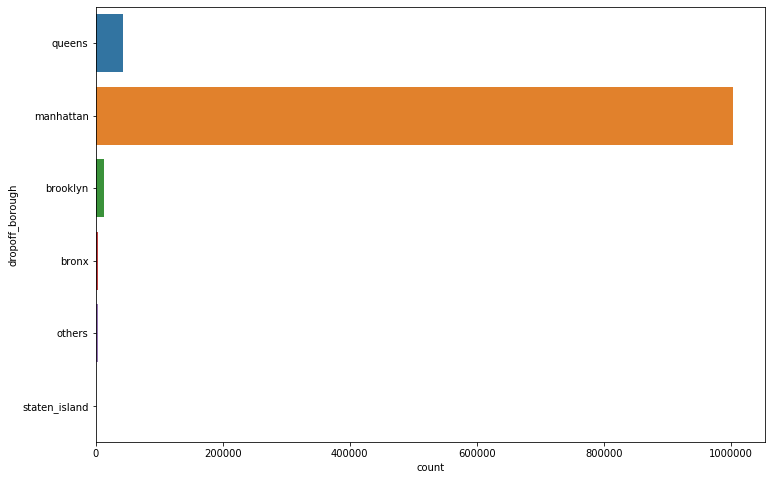

In [0]:
plt.figure(figsize = (12,8))
sns.countplot(y = df['dropoff_borough'])

Here, we have visualized the distribution of pickup boroughs and dropoff boroughs.<br>

Not a suprise, Manhattan has the highest number of pickups and dropoffs followed by Queens.

Finally, we will check the price distribution for each of the boroughs

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys


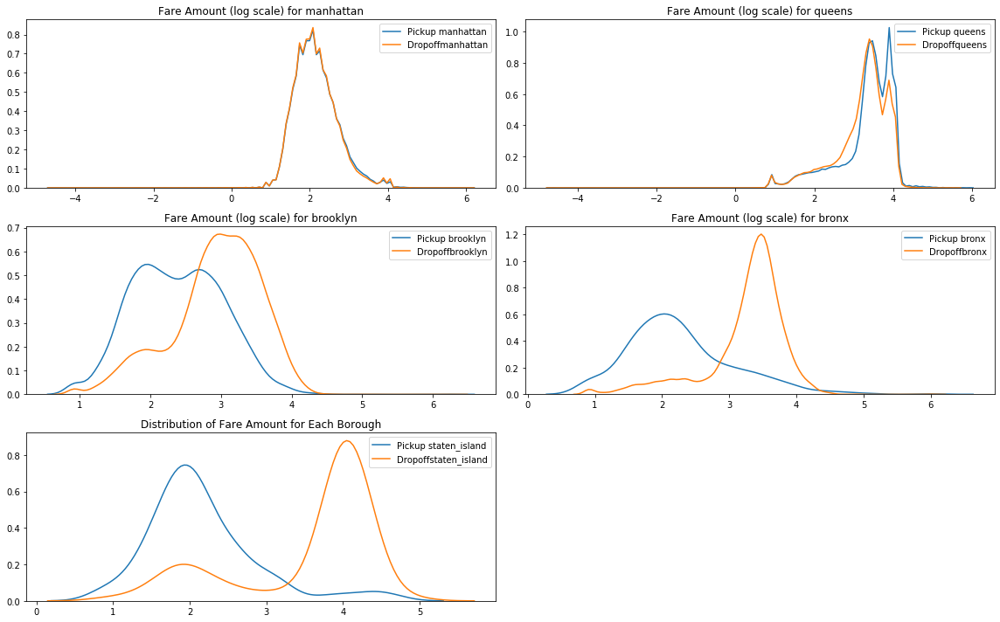

In [0]:
plt.figure(figsize = (16,10))

i = 1
for key in nyc_boroughs.keys():
    plt.subplot(3,2,i)
    sns.kdeplot(np.log(df.loc[df['pickup_borough']==key,'fare_amount'].values),label='Pickup '+ key)
    sns.kdeplot(np.log(df.loc[df['dropoff_borough']==key,'fare_amount'].values),label='Dropoff'+ key).set_title("Fare Amount (log scale) for "+key)
    i=i+1
plt.title('Distribution of Fare Amount for Each Borough')
plt.tight_layout()

### MACHINE LEARNING

In [0]:
df.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [0]:
X = df.drop(['key','fare_amount','pickup_datetime'], axis = 1)

y = df['fare_amount']

In [0]:
X.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,-73.844311,40.721319,-73.841610,40.712278,1
1,-74.016048,40.711303,-73.979268,40.782004,1
2,-73.982738,40.761270,-73.991242,40.750562,2
3,-73.987130,40.733143,-73.991567,40.758092,1
4,-73.968095,40.768008,-73.956655,40.783762,1


In [0]:
y.head()

0     4.5
1    16.9
2     5.7
3     7.7
4     5.3
Name: fare_amount, dtype: float64

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25)

### LINEAR REGRESSION

In [0]:
lin_reg = linear_model.LinearRegression()
lin_reg.fit(X_train, y_train)
lin_pred = lin_reg.predict(X_test)

lin_error = mean_squared_error(y_test,lin_pred)
lin_r2 = r2_score(y_test,lin_pred)

In [0]:
print(f'Mean Squared Error for Linear Regression: {lin_error}')
print('\n')
print(f'R2 Score for Linear Regression: {lin_r2}')

Mean Squared Error for Linear Regression: 70.00993834859254


R2 Score for Linear Regression: 0.2561362957098128


### RIDGE REGRESSION

In [0]:
rid_reg = linear_model.Ridge(alpha=.5)
rid_reg.fit(X_train, y_train)
rid_pred = rid_reg.predict(X_test)

rid_error = mean_squared_error(y_test,rid_pred)
rid_r2 = r2_score(y_test,rid_pred)

In [0]:
print(f'Mean Squared Error for Ridge Regression: {rid_error}')
print('\n')
print(f'R2 Score for Ridge Regression: {rid_r2}')

Mean Squared Error for Ridge Regression: 70.00966764094561


R2 Score for Ridge Regression: 0.25613917200991776


### LASSO REGRESSION

In [0]:
lasso_reg = linear_model.Lasso(alpha=0.1)
lasso_reg.fit(X_train, y_train)
lasso_pred = lasso_reg.predict(X_test)

lasso_error = mean_squared_error(y_test, lasso_pred)
lasso_r2 = r2_score(y_test, lasso_pred)

In [0]:
print(f'Mean Squared Error for Lasso Regression: {lasso_error}')
print('\n')
print(f'R2 Score for Lasso Regression: {lasso_r2}')

Mean Squared Error for Lasso Regression: 87.17457011678741


R2 Score for Lasso Regression: 0.07376009497254776


### K-NEAREST NEIGHBORS

In [0]:
knn = KNeighborsRegressor(n_neighbors=4)
knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)

knn_error = mean_squared_error(y_test, knn_pred)
knn_r2 = r2_score(y_test, knn_pred)

In [0]:
print(f'Mean Squared Error for K-Nearest Neighbor: {knn_error}')
print('\n')
print(f'R2 Score for K-Nearest Neighbor: {knn_r2}')

Mean Squared Error for K-Nearest Neighbor: 20.41052551429924


R2 Score for K-Nearest Neighbor: 0.7831358022345518


### DECISION TREE


In [0]:
cart = DecisionTreeRegressor()
cart.fit(X_train, y_train)
cart_pred = cart.predict(X_test)

cart_error = mean_squared_error(y_test, cart_pred)
cart_r2 = r2_score(y_test, cart_pred)

In [0]:
print(f'Mean Squared Error for Decision Tree: {cart_error}')
print('\n')
print(f'R2 Score for Decision Tree: {cart_r2}')

Mean Squared Error for Decision Tree: 33.488145551338526


R2 Score for Decision Tree: 0.6441845745443593


### RANDOM FOREST

In [0]:
rand_regr = RandomForestRegressor(n_estimators=100)
rand_regr.fit(X_train, y_train)
rand_pred = rand_regr.predict(X_test)

rand_error = mean_squared_error(y_test, rand_pred)
rand_r2 = r2_score(y_test, rand_pred)

In [0]:
print(f'Mean Squared Error for Random Forest: {rand_error}')
print('\n')
print(f'R2 Score for Random Forest: {rand_r2}')

Mean Squared Error for Random Forest: 18.086985069537818


R2 Score for Random Forest: 0.8078236885986604


### ADABOOST

In [0]:
ada_regr = AdaBoostRegressor(random_state=0, n_estimators=100)
ada_regr.fit(X_train, y_train)
ada_pred = ada_regr.predict(X_test)

ada_error = mean_squared_error(y_test, ada_pred)
ada_r2 = r2_score(y_test,ada_pred)

In [0]:
print(f'Mean Squared Error for AdaBoost: {ada_error}')
print('\n')
print(f'R2 Score for AdaBoost: {ada_r2}')

Mean Squared Error for AdaBoost: 71.75043103887319


R2 Score for AdaBoost: 0.2376433592721936


### GRADIENT BOOSTING

In [0]:
grad_reg = GradientBoostingRegressor(n_estimators=100, learning_rate=0.01,max_depth=1, random_state=0, loss='ls')
grad_reg.fit(X_train, y_train)
grad_pred = grad_reg.predict(X_test)

grad_error = mean_squared_error(y_test, grad_pred)
grad_r2 = r2_score(y_test,grad_pred)

In [0]:
print(f'Mean Squared Error for AdaBoost: {grad_error}')
print('\n')
print(f'R2 Score for AdaBoost: {grad_r2}')

Mean Squared Error for AdaBoost: 71.50312296674711


R2 Score for AdaBoost: 0.24027103618452827


### BAGGING REGRESSOR

In [0]:
bag_reg= BaggingRegressor(n_estimators = 100)
bag_reg.fit(X_train, y_train)
bag_pred = bag_reg.predict(X_test)

bag_error = mean_squared_error(y_test, bag_pred)
bag_r2 = r2_score(y_test, bag_pred)

In [0]:
print(f'Mean Squared Error for Bagging Regressor: {bag_error}')
print('\n')
print(f'R2 Score for Bagging Regressor: {bag_r2}')

Mean Squared Error for Bagging Regressor: 18.158586105676275


R2 Score for Bagging Regressor: 0.8070629192960541


### ARTIFICIAL NEURAL NETWORK

In [0]:
cont_cols = ['pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'passenger_count']
conts_data = np.stack([df[col].values for col in cont_cols], 1)

In [0]:
X = torch.tensor(conts_data, dtype = torch.float)

In [0]:
y = torch.tensor(df['fare_amount'].values, dtype=torch.float).reshape(-1,1)

In [0]:
class TabularModel(nn.Module):

    def __init__(self, n_cont, out_sz, layers, p=0.5):
        super().__init__()
        self.emb_drop = nn.Dropout(p)
        self.bn_cont = nn.BatchNorm1d(n_cont)
        
        layerlist = []
        
        for i in layers:
            layerlist.append(nn.Linear(n_cont,i)) 
            layerlist.append(nn.ReLU(inplace=True))
            layerlist.append(nn.BatchNorm1d(i))
            layerlist.append(nn.Dropout(p))
            n_cont = i
        layerlist.append(nn.Linear(layers[-1],out_sz))
            
        self.layers = nn.Sequential(*layerlist)
    
    def forward(self, x_cont):
        x_cont = self.emb_drop(x_cont)
        
        x_cont = self.bn_cont(x_cont)
        x_cont = self.layers(x_cont)
        return x_cont

In [0]:
model = TabularModel(X.shape[1], 1, [200,100], p=0.4)

In [0]:
model

TabularModel(
  (emb_drop): Dropout(p=0.4, inplace=False)
  (bn_cont): BatchNorm1d(5, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): Sequential(
    (0): Linear(in_features=5, out_features=200, bias=True)
    (1): ReLU(inplace=True)
    (2): BatchNorm1d(200, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.4, inplace=False)
    (4): Linear(in_features=200, out_features=100, bias=True)
    (5): ReLU(inplace=True)
    (6): BatchNorm1d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.4, inplace=False)
    (8): Linear(in_features=100, out_features=1, bias=True)
  )
)

In [0]:
criterion = nn.SmoothL1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)

In [0]:
batch_size = 1066815
test_size = int(batch_size * .2)

X_train = X[:batch_size-test_size]
X_test = X[batch_size-test_size:batch_size]
y_train = y[:batch_size-test_size]
y_test = y[batch_size-test_size:batch_size]

In [0]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

torch.Size([853452, 5])
torch.Size([853452, 1])
torch.Size([213363, 5])
torch.Size([213363, 1])


In [0]:
import time
start_time = time.time()

epochs = 100
losses = []

for i in range(epochs):
    i+=1
    y_pred = model(X_train)
    loss = criterion(y_pred, y_train) # RMSE
    losses.append(loss)
    
    
    if i%25 == 1:
        print(f'epoch: {i:3}  loss: {loss.item():10.8f}')

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

print(f'epoch: {i:3}  loss: {loss.item():10.8f}') 
print(f'\nDuration: {time.time() - start_time:.0f} seconds') 

epoch:   1  loss: 10.89196587
epoch:  26  loss: 5.36123133
epoch:  51  loss: 5.12457466
epoch:  76  loss: 4.97506046
epoch: 100  loss: 4.95315266

Duration: 3010 seconds


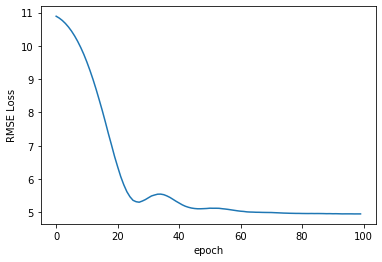

In [0]:
plt.plot(range(epochs), losses)
plt.ylabel('RMSE Loss')
plt.xlabel('epoch');

In [0]:
with torch.no_grad():
    y_val = model(X_test)
    loss = torch.sqrt(criterion(y_val, y_test))
print(f'RMSE: {loss:.8f}')

RMSE: 2.22084880


In [0]:
print(f'{"PREDICTED":>12} {"ACTUAL":>8} {"DIFF":>8}')
for i in range(50):
    diff = np.abs(y_val[i].item()-y_test[i].item())
    print(f'{i+1:2}. {y_val[i].item():8.4f} {y_test[i].item():8.4f} {diff:8.4f}')

   PREDICTED   ACTUAL     DIFF
 1.   6.7563   7.0000   0.2437
 2.   8.5826  26.6700  18.0874
 3.   8.5963   6.5000   2.0963
 4.   7.4395  52.0000  44.5605
 5.   9.5854  14.0000   4.4146
 6.   8.0725   6.1000   1.9725
 7.   8.6749   5.3000   3.3749
 8.   9.4578   5.5000   3.9578
 9.   9.0602   8.0000   1.0602
10.   9.0620   5.0000   4.0620
11.   8.9271  18.5000   9.5729
12.   8.9402   8.5000   0.4402
13.  10.1870   5.3000   4.8870
14.   9.4536  17.3000   7.8464
15.   7.5636   7.5000   0.0636
16.   7.0162  26.9000  19.8838
17.   8.7828  17.3000   8.5172
18.   8.0713  14.5000   6.4287
19.   9.4842   4.9000   4.5842
20.   9.8966   9.3000   0.5966
21.   8.5673  14.0000   5.4327
22.   9.1236   4.9000   4.2236
23.   7.4105  12.9000   5.4895
24.   8.8022  14.0000   5.1978
25.   9.0027   6.5000   2.5027
26.   8.0135   8.9000   0.8865
27.   7.6428   5.7000   1.9428
28.   8.0773  10.0000   1.9227
29.   7.6979   4.1000   3.5979
30.   6.4646   3.3000   3.1646
31.   8.5323  21.3000  12.7677
32.   7.

### Conclusion

The Neural Network Model has an RMSE value of 2.220. <br>
Further improvements can be made to the model by adding more number of hidden layers as well as more number of neurons in each hidden layer.

